## Install YOLOv8

YOLOv8 is still under heavy development. Breaking changes are being introduced almost weekly. We strive to make our YOLOv8 notebooks work with the latest version of the library. Last tests took place on **27.01.2023** with version **YOLOv8.0.20**.

If you notice that our notebook behaves incorrectly - especially if you experience errors that prevent you from going through the tutorial - don't hesitate! Let us know and open an [issue](https://github.com/roboflow/notebooks/issues) on the Roboflow Notebooks repository.

YOLOv8 can be installed in two ways - from the source and via pip. This is because it is the first iteration of YOLO to have an official package.

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
%cd drive/MyDrive/cz3004-imageRec/

/content/drive/MyDrive/cz3004-imageRec


In [ ]:
# library installation
!pip install ultralytics==8.0.134

from IPython import display
display.clear_output()

!pip install roboflow
!pip install PyYAML

In [ ]:
import ultralytics
ultralytics.checks()
from ultralytics import YOLO
from IPython.display import display, Image
from roboflow import Roboflow
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import glob
import yaml
import os
import random

Ultralytics YOLOv8.0.134 🚀 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 26.5/166.8 GB disk)


In [ ]:
!nvidia-smi

Sat Sep  9 04:16:36 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 525.105.17   Driver Version: 525.105.17   CUDA Version: 12.0     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   39C    P8     9W /  70W |      3MiB / 15360MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [ ]:
# Update with actual API KEY
rf = Roboflow(api_key="12345")
project = rf.workspace("mdpgrp34").project("mdpgrp34")
dataset = project.version(1).download("yolov8")

loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to MDPGrp34-1 in yolov8:: 100%|██████████| 33252/33252 [04:59<00:00, 111.20it/s]


In [ ]:
# Load the data from the YAML file
with open('MDPGrp34-1/data.yaml', 'r') as file:
    data = yaml.load(file, Loader=yaml.FullLoader)

print(data)

{'names': ['100', '101', '102', '11', '12', '13', '14', '15', '16', '17', '18', '19', '20', '21', '22', '23', '24', '25', '26', '27', '28', '29', '30', '31', '32', '33', '34', '35', '36', '37', '38', '39', '40', '99'], 'nc': 34, 'roboflow': {'license': 'CC BY 4.0', 'project': 'mdpgrp34', 'url': 'https://universe.roboflow.com/mdpgrp34/mdpgrp34/dataset/1', 'version': 1, 'workspace': 'mdpgrp34'}, 'test': 'MDPGrp34-1/test/images', 'train': 'MDPGrp34-1/train/images', 'val': 'MDPGrp34-1/valid/images'}


## Train using Roboflow dataset

In [ ]:
# get the number of train, validation and test data
train_images_num, train_labels_num = len(os.listdir("MDPGrp34-1/train/images")), len(os.listdir("MDPGrp34-1/train/labels"))
valid_images_num, valid_labels_num = len(os.listdir("MDPGrp34-1/valid/images")), len(os.listdir("MDPGrp34-1/valid/labels"))
test_images_num, test_labels_num = len(os.listdir("MDPGrp34-1/test/images")), len(os.listdir("MDPGrp34-1/test/labels"))
print(f"train: #images: {train_images_num}, #labels: {train_labels_num}")
print(f"validation: #images: {valid_images_num}, #labels: {valid_labels_num}")
print(f"test: #images: {test_images_num}, #labels: {test_labels_num}")

train: #images: 14550, #labels: 14550
validation: #images: 1360, #labels: 1360
test: #images: 710, #labels: 710


In [ ]:
!yolo task=detect mode=train model=yolov8s.pt data='MDPGrp34-1/data.yaml' epochs=25 imgsz=416 plots=True

100% 21.5M/21.5M [00:00<00:00, 174MB/s]
New https://pypi.org/project/ultralytics/8.0.173 available 😃 Update with 'pip install -U ultralytics'
Ultralytics YOLOv8.0.134 🚀 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)
yolo/engine/trainer: task=detect, mode=train, model=yolov8s.pt, data=MDPGrp34-1/data.yaml, epochs=25, patience=50, batch=16, imgsz=416, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=None, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, show=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, vid_stride=1, line_width=None, visualize=False, augment=Fals

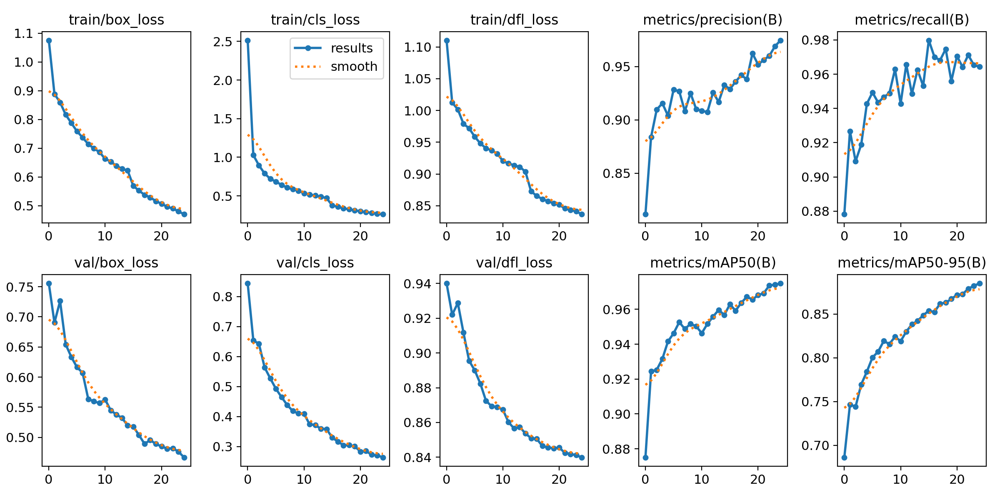

In [ ]:
# display the results
Image(filename="runs/detect/train/results.png")

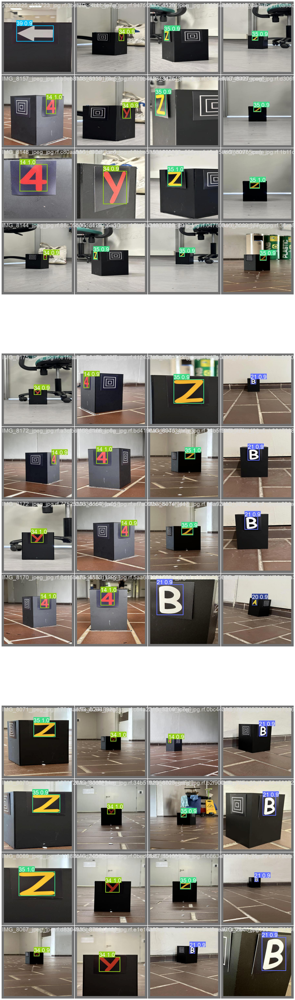

In [ ]:
# display validation prediction
valid_path = [f"runs/detect/train/val_batch{i}_pred.jpg" for i in range(0,3)]
# Create a subplot for each image
fig, axs = plt.subplots(3, 1, figsize=(300,100))

for i, path in enumerate(valid_path):
    img = mpimg.imread(path)
    axs[i].imshow(img)
    axs[i].axis('off')

plt.show()

## Validate Model

In [ ]:
setting_path = "/root/.config/Ultralytics/settings.yaml"
with open(setting_path, 'r') as setting_file:
    setting_content = setting_file.read()

new_content = setting_content.replace("datasets_dir: /content/datasets", "datasets_dir: /content/drive/MyDrive/cz3004-imageRec/datasets")

with open(setting_path, 'w') as file:
    file.write(new_content)
print(new_content)

datasets_dir: /content/drive/MyDrive/cz3004-imageRec/datasets
weights_dir: weights
runs_dir: runs
uuid: 569f3ba64b326db489132663f79cd37279811de477381b83ac131e6cdd129cbb
sync: true
api_key: ''
settings_version: 0.0.3



In [ ]:
!yolo task=detect mode=val model=runs/detect/train/weights/best.pt data=MDPGrp34-1/data.yaml

Ultralytics YOLOv8.0.134 🚀 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 11138742 parameters, 0 gradients
val: Scanning /content/drive/MyDrive/cz3004-imageRec/datasets/MDPGrp34-1/valid/labels.cache... 1360 images, 0 backgrounds, 0 corrupt: 100% 1360/1360 [00:00<?, ?it/s]
WARNING ⚠️ Box and segment counts should be equal, but got len(segments) = 3, len(boxes) = 1467. To resolve this only boxes will be used and all segments will be removed. To avoid this please supply either a detect or segment dataset, not a detect-segment mixed dataset.
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% 85/85 [00:17<00:00,  4.92it/s]
                   all       1360       1467      0.975      0.964      0.975      0.886
                   100       1360         15      0.632        0.4       0.55      0.384
                   101       1360         28      0.848      0.598      0.822      0.728
              

## Inference with Custom Model

In [ ]:
!yolo task=detect mode=predict model=runs/detect/train/weights/best.pt conf=0.25 source=MDPGrp34-1/test/images save=True

Ultralytics YOLOv8.0.134 🚀 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 11138742 parameters, 0 gradients

image 1/710 /content/drive/MyDrive/cz3004-imageRec/datasets/MDPGrp34-1/test/images/20230825_122849_jpg.rf.2efc05baaf404b260a2d4d9417a3e6f5.jpg: 416x416 1 39, 10.6ms
image 2/710 /content/drive/MyDrive/cz3004-imageRec/datasets/MDPGrp34-1/test/images/20230825_123426_jpg.rf.baa7792ac21a617ae19276fb297a276b.jpg: 416x416 1 39, 10.7ms
image 3/710 /content/drive/MyDrive/cz3004-imageRec/datasets/MDPGrp34-1/test/images/20230825_123439_jpg.rf.9a28711fbcfa9c2132fa9eddb07203e8.jpg: 416x416 1 39, 10.7ms
image 4/710 /content/drive/MyDrive/cz3004-imageRec/datasets/MDPGrp34-1/test/images/20230825_123606_jpg.rf.d3169f373474a3838bbf65afcca17e3e.jpg: 416x416 1 39, 10.6ms
image 5/710 /content/drive/MyDrive/cz3004-imageRec/datasets/MDPGrp34-1/test/images/20230825_124201_jpg.rf.e67b0a9aa573891d56d557bd2bc5b257.jpg: 416x416 1 39, 10.7ms
image 6/710 /conte

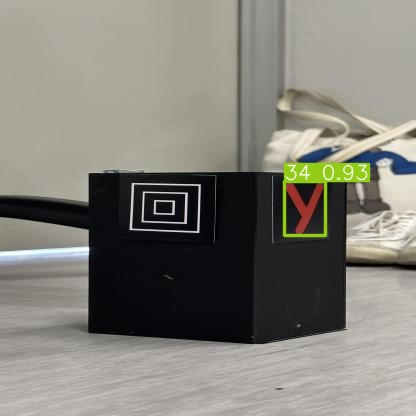

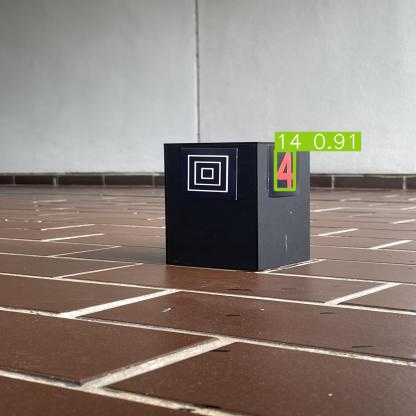

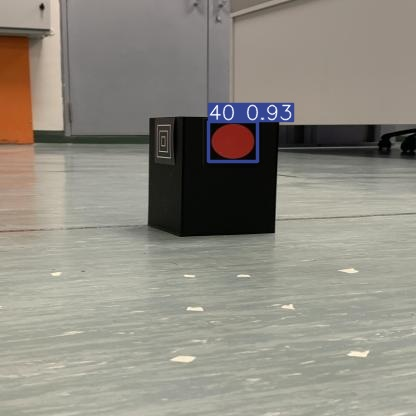

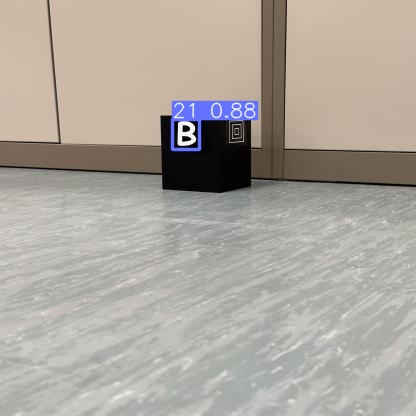

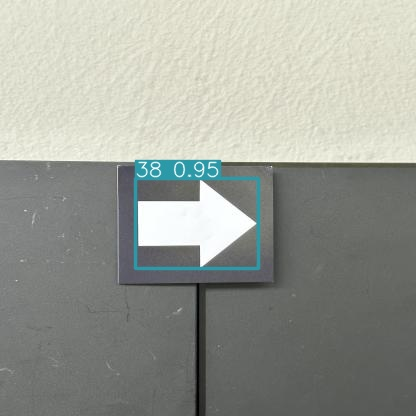

In [ ]:
predict_path = "runs/detect/predict/"
image_files = os.listdir(predict_path)
random.shuffle(image_files) # randomly pick images
selected_images = image_files[:5]
for image in selected_images:
  image_path = os.path.join(predict_path, image)
  display(Image(filename=image_path, width=800))
  print("\n")

## Test PiCamera images

In [ ]:
%cd /content/drive/MyDrive/cz3004-imageRec/

/content/drive/MyDrive/cz3004-imageRec


In [ ]:
!yolo task=detect mode=predict model=datasets/runs/detect/train/weights/best.pt conf=0.25 source=picamera_test save=True

Ultralytics YOLOv8.0.134 🚀 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 11138742 parameters, 0 gradients

image 1/3 /content/drive/MyDrive/cz3004-imageRec/picamera_test/original_A_bulls.jpg: 256x416 1 20, 97.5ms
image 2/3 /content/drive/MyDrive/cz3004-imageRec/picamera_test/processed_A_bulls.jpg: 256x416 1 20, 8.1ms
image 3/3 /content/drive/MyDrive/cz3004-imageRec/picamera_test/resized_A_bulls.jpg: 416x416 1 20, 11.7ms
Speed: 6.2ms preprocess, 39.1ms inference, 34.0ms postprocess per image at shape (1, 3, 416, 416)
Results saved to runs/detect/predict


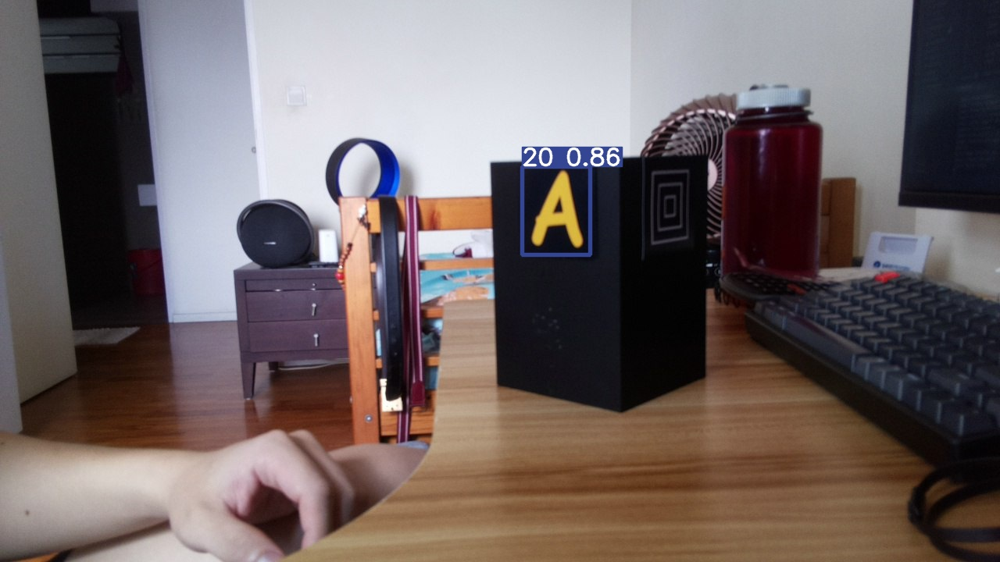

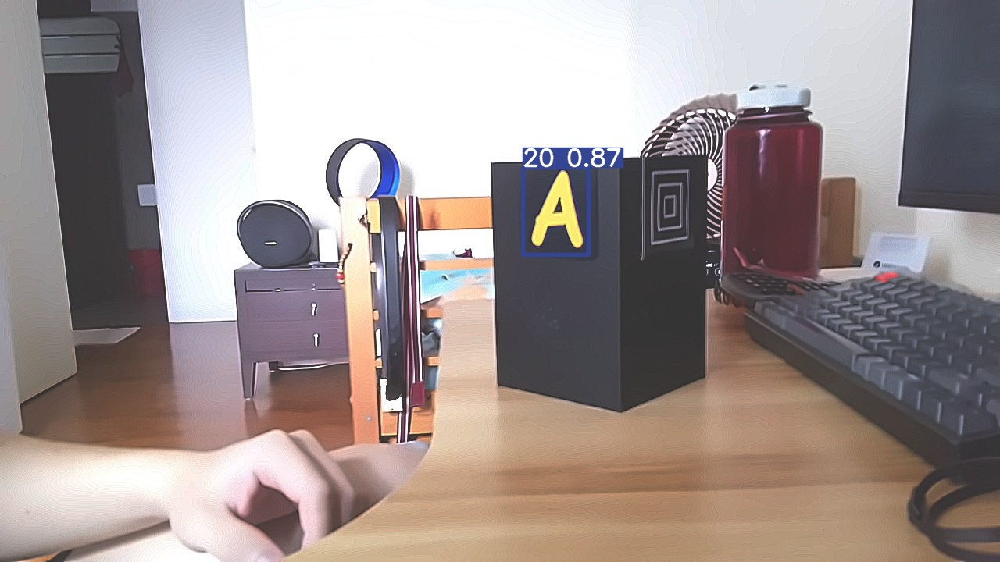

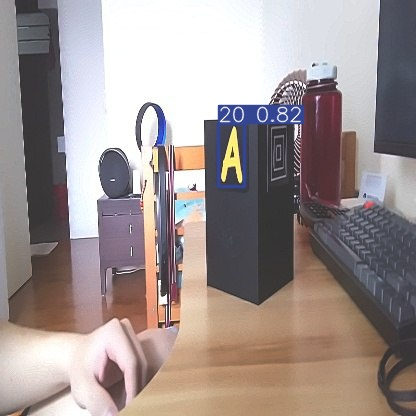

In [ ]:
image_files = [f for f in os.listdir("picamera_test/runs/detect/predict") if f.endswith(".jpg")]

for image_file in image_files:
    image_path = os.path.join("picamera_test/runs/detect/predict", image_file)
    display(Image(filename=image_path))

## Deploy model on Roboflow

Once you have finished training your YOLOv8 model, you’ll have a set of trained weights ready for use. These weights will be in the `/runs/detect/train/weights/best.pt` folder of your project. You can upload your model weights to Roboflow Deploy to use your trained weights on our infinitely scalable infrastructure.

The `.deploy()` function in the [Roboflow pip package](https://docs.roboflow.com/python) now supports uploading YOLOv8 weights.

To upload model weights, add the following code to the “Inference with Custom Model” section in the aforementioned notebook:

In [ ]:
project.version(dataset.version).deploy(model_type="yolov8", model_path=f"{HOME}/runs/detect/train/")

View the status of your deployment at: https://app.roboflow.com/roboflow-jvuqo/football-players-detection-3zvbc/1
Share your model with the world at: https://universe.roboflow.com/roboflow-jvuqo/football-players-detection-3zvbc/1


In [ ]:
#While your deployment is processing, checkout the deployment docs to take your model to most destinations https://docs.roboflow.com/inference

In [ ]:
#Run inference on your model on a persistant, auto-scaling, cloud API

#load model
model = project.version(dataset.version).model

#choose random test set image
import os, random
test_set_loc = dataset.location + "/test/images/"
random_test_image = random.choice(os.listdir(test_set_loc))
print("running inference on " + random_test_image)

pred = model.predict(test_set_loc + random_test_image, confidence=40, overlap=30).json()
pred